# Simulating a plant with time-dependent control actions - Part II

We'll now generate a similar animation with a bigger system.

In [1]:
import control
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# Start by importing our animation libraries
%config InlineBackend.figure_formats = {'svg',}
import matplotlib.pylab as plt
import matplotlib.gridspec as gridspec
from IPython.display import display
from matplotlib import animation
from IPython.display import HTML

## Create a transfer function matrix

We are going to build a transfer function matrix where each TF has this form:

$$ G = \frac{a}{bs+c} $$

We will put those TF coefficients into a Python list, row-wise:

```python
[ [a_11], [b_11,c_11] ], 
[ [a_12], [b_12,c_12] ],
[ [a_13], [b_13,c_13] ],
[ [a_21], [b_22,c_23] ],
...
[ [a_nn], [b_nn,c_nn] ],
```

In this order:

$$
M = \begin{bmatrix}
G_{11} & G_{12} & G_{13} \\
G_{21} & G_{22} & G_{23} \\
G_{31} & G_{32} & G_{33}  
\end{bmatrix}$$

In [3]:
tf_coeffs = [
    [[12.8], [16.7,1]],
    [[-18.9], [21.0,1]],
    [[6.6], [10.9,1]],
    [[-19.4], [14.4,1]],
    [[3.8], [14.9,1]],
    [[4.9], [13.2,1]],
    [[20.4], [11.4,1]],
    [[3.2], [21.5,1]],
    [[4.1], [10.2,1]]    
]

td_coeffs = [1,3,7,3,8,3,5,6,7]

# Empty list to store all transfer functions
g_array = []

# Generate transfer functions
for tf, td in zip(tf_coeffs, td_coeffs):
    g_tf = control.tf([num for num in tf[0]],[den for den in tf[1]])
    g_delay = control.tf(control.pade(td,1)[0],control.pade(td,1)[1])
    g = g_tf*g_delay
    g_array.append(g)

In [4]:
nums = [g.num[0][0] for g in g_array]
dens = [g.den[0][0] for g in g_array]

We now have a list of arrays, where each array contains the 2 numerator coefficients for a transfer function:

In [5]:
nums

[array([-12.8,  25.6]),
 array([ 18.9, -12.6]),
 array([-6.6       ,  1.88571429]),
 array([ 19.4       , -12.93333333]),
 array([-3.8 ,  0.95]),
 array([-4.9       ,  3.26666667]),
 array([-20.4 ,   8.16]),
 array([-3.2       ,  1.06666667]),
 array([-4.1       ,  1.17142857])]

Similarly, we have another list of arrays, where each array contains the 3 denominator coefficients for a transfer function:

In [6]:
dens

[array([16.7, 34.4,  2. ]),
 array([21.        , 15.        ,  0.66666667]),
 array([10.9       ,  4.11428571,  0.28571429]),
 array([14.4       , 10.6       ,  0.66666667]),
 array([14.9  ,  4.725,  0.25 ]),
 array([13.2       ,  9.8       ,  0.66666667]),
 array([11.4 ,  5.56,  0.4 ]),
 array([21.5       ,  8.16666667,  0.33333333]),
 array([10.2       ,  3.91428571,  0.28571429])]

For a MIMO system, the `python-control` library asks that we supply **lists of lists of vectors**.

In simpler terms, we need to call `control.tf` with 2 lists, one containing numerator stuff and the other one containing denominator stuff.

```
control.tf(num_stuff,denom_stuff)
```

The numerator list itself is in this form:

```
num_stuff = [row1_stuff, 
            row2_stuff, 
            row3_stuff]
```

And each row of stuff should contain a list of vectors of the coefficients:

```
row1_stuff = [array([1,2]),
              array([3,4]),
              array([5,6])]
```

So now we need to split our `nums` list into 3 lists, one for each row:

In [7]:
nums

[array([-12.8,  25.6]),
 array([ 18.9, -12.6]),
 array([-6.6       ,  1.88571429]),
 array([ 19.4       , -12.93333333]),
 array([-3.8 ,  0.95]),
 array([-4.9       ,  3.26666667]),
 array([-20.4 ,   8.16]),
 array([-3.2       ,  1.06666667]),
 array([-4.1       ,  1.17142857])]

We can use the `itertools` recipes to easily do this:

https://docs.python.org/3/library/itertools.html#recipes


In [8]:
import itertools
from itertools import repeat

def zip_longest(*args, fillvalue=None):
    # zip_longest('ABCD', 'xy', fillvalue='-') --> Ax By C- D-
    iterators = [iter(it) for it in args]
    num_active = len(iterators)
    if not num_active:
        return
    while True:
        values = []
        for i, it in enumerate(iterators):
            try:
                value = next(it)
            except StopIteration:
                num_active -= 1
                if not num_active:
                    return
                iterators[i] = repeat(fillvalue)
                value = fillvalue
            values.append(value)
        yield tuple(values)

        
def grouper(iterable, n, fillvalue=None):
    "Collect data into fixed-length chunks or blocks"
    # grouper('ABCDEFG', 3, 'x') --> ABC DEF Gxx"
    args = [iter(iterable)] * n
    return zip_longest(*args, fillvalue=fillvalue)

In [9]:
nums_per_row = list(grouper(nums,3))
dens_per_row = list(grouper(dens,3))

In [10]:
sys = control.tf(
    nums_per_row,
    dens_per_row
)
sys


Input 1 to output 1:
    -12.8 s + 25.6
---------------------
16.7 s^2 + 34.4 s + 2

Input 1 to output 2:
      19.4 s - 12.93
--------------------------
14.4 s^2 + 10.6 s + 0.6667

Input 1 to output 3:
    -20.4 s + 8.16
-----------------------
11.4 s^2 + 5.56 s + 0.4

Input 2 to output 1:
    18.9 s - 12.6
----------------------
21 s^2 + 15 s + 0.6667

Input 2 to output 2:
      -3.8 s + 0.95
-------------------------
14.9 s^2 + 4.725 s + 0.25

Input 2 to output 3:
      -3.2 s + 1.067
---------------------------
21.5 s^2 + 8.167 s + 0.3333

Input 3 to output 1:
      -6.6 s + 1.886
---------------------------
10.9 s^2 + 4.114 s + 0.2857

Input 3 to output 2:
      -4.9 s + 3.267
-------------------------
13.2 s^2 + 9.8 s + 0.6667

Input 3 to output 3:
      -4.1 s + 1.171
---------------------------
10.2 s^2 + 3.914 s + 0.2857

In [11]:
# Generate a step response grid
T = np.linspace(0,100,1000)

# Get the responses for each MV
y_MVs = []
for i in range(3):
    _, y = control.step_response(sys,T,input=i)
    y_MVs.append(y)
    
# Flatten
flat_y = list(itertools.chain(*y_MVs))

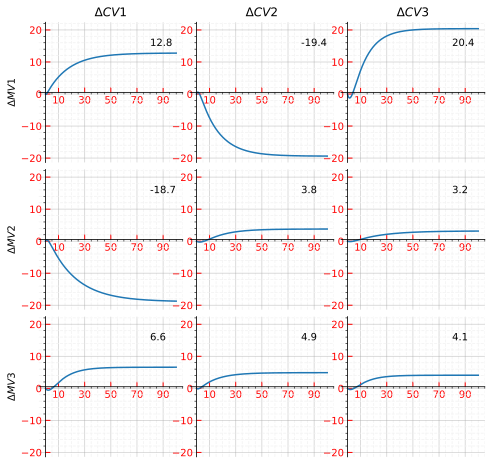

In [12]:
# Create sub plots
n = 3
gs = gridspec.GridSpec(n,n)
f = plt.figure(figsize=(8,8));
gs.tight_layout(f)
gs.update(wspace=0.05, hspace=0.05) # set the spacing between axes. 

axs = []
lines = []
texts = []

for num,y_MV in enumerate(flat_y):
        
    # Make all y-axis the same
    if num == 0:
        ax = f.add_subplot(gs[num])
    else:
        ax = f.add_subplot(gs[num], sharey=axs[0])
        
    line, = ax.plot(T, y_MV, lw=1.5)
    
    ax.tick_params(direction='in', length=5, width=1, colors='r',
               grid_color='r', grid_alpha=0.5)

    ax.minorticks_on()
    ax.spines['left'].set_position('zero')
    ax.spines['bottom'].set_position('center')    
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    
    ax.xaxis.set_ticks(np.arange(10, 105, 20))
    ax.grid(b=True, which='major', color='0.65', linestyle='-',zorder=0)
    ax.grid(b=True, which='minor', color='0.95', linestyle='--',zorder=0)
    
    text = ax.text(80,15, '{0:.1f}'.format(y_MV[-1]))
    
    # Apply labels to the right grid
    if num < n:
        ax.set_title('$\Delta CV$' + str((num + 1)))
        
    if num % n == 0:
        ax.set_ylabel('$\Delta MV$' + str((num // n + 1)))
            
    axs.append(ax)
    lines.append(line)
    texts.append(text)

In [15]:
# How many data points to skip for plotting
skip = 10

# We'll hold the last value for 50 frames
max_frames = round(len(T)/skip)
hold_frames = 50


# The animation function. This is called sequentially, frame by frame, to create the animated plot.
def drawframe(n):
    for num, (line, text) in enumerate(zip(lines,texts)):
        if n < max_frames:
            line.set_data(T[0:n*skip:skip],flat_y[num][0:n*skip:skip])
            text.set_text('{0:.1f}'.format(flat_y[num][::skip][n]))
        else:
            pass

    # Print out the current frame using "\r", the 'carriage return' character, as our end character.
    # This makes Python print the frame on the same line.
    print("Frame: {:0d}".format(n), end="\r")
    return (lines)

In [16]:
# The `interval` parameter is the delay between frames in milliseconds and it controls the speed of the animation. 
anim = animation.FuncAnimation(f, drawframe, frames=max_frames+hold_frames, interval=20, blit=True)
HTML(anim.to_jshtml())

### We can also save the output as a .gif
http://louistiao.me/posts/notebooks/save-matplotlib-animations-as-gifs/

In [17]:
anim.save('animation_3x3.gif', writer='imagemagick', fps=60, dpi=100)

In [18]:
from IPython.display import Image
Image(url='animation_3x3.gif')